In [22]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import os
from torch.optim.lr_scheduler import StepLR
from torchvision import transforms

from SRCNN1 import SRCNN1
from SRCNN2 import SRCNN2
from SRCNN_data_loading import train_dataset, val_dataset, test_dataset
from SRCNN_logger import Logger, plot
from SRCNN_image_show import image_show

In [3]:
# Hyperperemeters
batch_size = 10
lr = 0.001
epochs = 50

In [4]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [5]:
print(len(train_loader))
print(len(val_loader))
print(len(test_loader))
print(len(train_dataset[0]))

sample = train_dataset[0]  # the first sample
sample_lr, sample_hr = sample[0], sample[1]
print(sample_lr.shape)
print(sample_hr.shape)

# print(sample_hr)

55
25
10
2
torch.Size([3, 128, 128])
torch.Size([3, 256, 256])


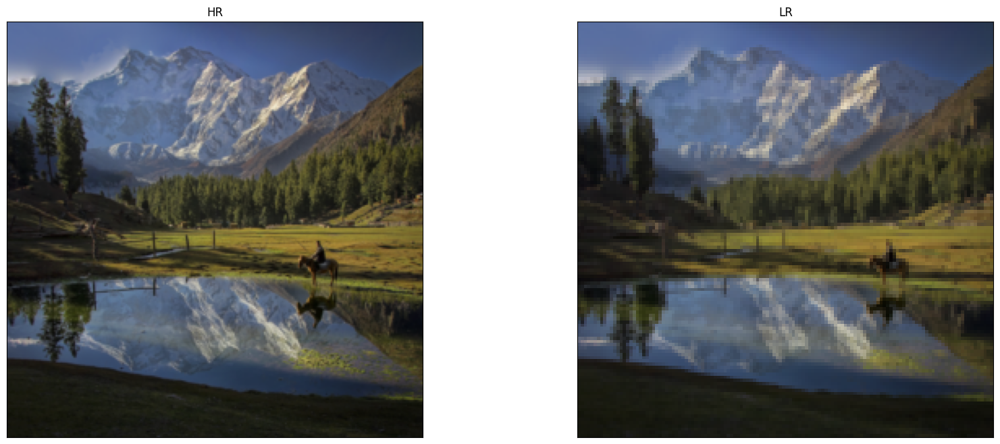

In [6]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 8))
sample_hr1 = sample_hr.permute(1, 2, 0)
sample_lr1 = sample_lr.permute(1, 2, 0)
axs[0].imshow(sample_hr1)
axs[1].imshow(sample_lr1)
# axs[2].imshow(outputs)

axs[0].set_title('HR')
axs[1].set_title('LR')

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [7]:
from skimage import color
from skimage.metrics import structural_similarity

def snr(hr_image, output_image):
    mse = np.mean((hr_image - output_image) ** 2)
    return 10 * np.log10(np.mean(hr_image ** 2) / mse)

def psnr(hr_image, output_image):
    mse = np.mean((hr_image - output_image) ** 2)
    return 10 * np.log10(1 / mse)

def ssim(hr_image, output_image, data_range):
    hr_image_gray = color.rgb2gray(hr_image)
    output_image_gray = color.rgb2gray(output_image)
    return structural_similarity(hr_image_gray, output_image_gray, data_range=data_range)

In [8]:
def evaluate(model, loader, device, test_mode = False):
    model.eval()
    snr_sum = 0
    psnr_sum = 0
    ssim_sum = 0
    num_samples = 0

    with torch.no_grad():
        for lr, hr in loader:
            lr = lr.to(device)
            hr = hr.to(device)

            outputs = model(lr)

            outputs = outputs.squeeze().cpu().permute(0, 2, 3, 1).numpy()
            hr = hr.squeeze().cpu().permute(0, 2, 3, 1).numpy()

            for i in range(hr.shape[0]):
                snr_value = snr(hr[i], outputs[i])
                psnr_value = psnr(hr[i], outputs[i])
                ssim_value = ssim(hr[i], outputs[i], data_range=outputs[i].max() - outputs[i].min())

                snr_sum += snr_value
                psnr_sum += psnr_value
                ssim_sum += ssim_value

                num_samples += 1

            if test_mode:
                lr = lr.squeeze().cpu().permute(0, 2, 3, 1).numpy()
                image_show(hr[i],lr[i], outputs[i])

    # Average
    snr_avg = snr_sum / num_samples
    psnr_avg = psnr_sum / num_samples
    ssim_avg = ssim_sum / num_samples

    return snr_avg, psnr_avg, ssim_avg

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("mps")
print(device)

cuda


In [10]:
# model = SRResNet(num_residual_blocks=num_residual_blocks).to(device)
model = SRCNN2().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = lr)
# scheduler = StepLR(optimizer, step_size=30, gamma=0.1)

model_save_dir = "saved_model"
os.makedirs(model_save_dir, exist_ok=True)
best_valid_psnr = 0
logger = Logger()

for epoch in range(epochs):
    model.train()
    for inputs_lr, targets_hr in train_loader:
        inputs_lr = inputs_lr.to(device)
        targets_hr = targets_hr.to(device)        
        
        # Forward
        outputs = model(inputs_lr)
        loss = criterion(outputs, targets_hr)

        # Backprop
        optimizer.zero_grad()        
        loss.backward()
        optimizer.step()

    # Evaluate
    train_snr, train_psnr, train_ssim = evaluate(model, train_loader, device, test_mode = False)
    valid_snr, valid_psnr, valid_ssim = evaluate(model, val_loader, device, test_mode = False)

    logger.append(loss.item(), train_snr, valid_snr, train_psnr, valid_psnr, train_ssim, valid_ssim)
    print(f"Epoch [{epoch + 1}/{epochs}]", "Loss: %.4f; " % loss.item(),
          "Train SNR: %.4f" % train_snr, "Valid SNR: %.4f; " % valid_snr,
          "Train PSNR: %.4f" % train_psnr, "Valid PSNR: %.4f; " % valid_psnr,
          "Train SSIM: %.4f" % train_ssim, "Valid SSIM: %.4f" % valid_ssim)

    if valid_psnr > best_valid_psnr:
        best_valid_psnr = valid_psnr
        model_save_path = os.path.join(model_save_dir, "best_model_535.pth")
        torch.save(model.state_dict(), model_save_path)
        print(f"Model Update: New PSNR: {best_valid_psnr}")

    # scheduler.step()

Epoch [1/50] Loss: 0.0044;  Train SNR: 16.4939 Valid SNR: 16.1480;  Train PSNR: 22.8262 Valid PSNR: 22.6749;  Train SSIM: 0.7530 Valid SSIM: 0.7470
Model Update: New PSNR: 22.674850274238768
Epoch [2/50] Loss: 0.0024;  Train SNR: 18.8942 Valid SNR: 18.5097;  Train PSNR: 25.2265 Valid PSNR: 25.0366;  Train SSIM: 0.8285 Valid SSIM: 0.8234
Model Update: New PSNR: 25.036581733642116
Epoch [3/50] Loss: 0.0039;  Train SNR: 20.0628 Valid SNR: 19.6497;  Train PSNR: 26.3951 Valid PSNR: 26.1765;  Train SSIM: 0.8629 Valid SSIM: 0.8587
Model Update: New PSNR: 26.176511002235678
Epoch [4/50] Loss: 0.0026;  Train SNR: 19.8338 Valid SNR: 19.4630;  Train PSNR: 26.1660 Valid PSNR: 25.9898;  Train SSIM: 0.8726 Valid SSIM: 0.8687
Epoch [5/50] Loss: 0.0023;  Train SNR: 20.8682 Valid SNR: 20.4318;  Train PSNR: 27.2005 Valid PSNR: 26.9586;  Train SSIM: 0.8811 Valid SSIM: 0.8771
Model Update: New PSNR: 26.958639539598487
Epoch [6/50] Loss: 0.0021;  Train SNR: 20.9497 Valid SNR: 20.5246;  Train PSNR: 27.2820 

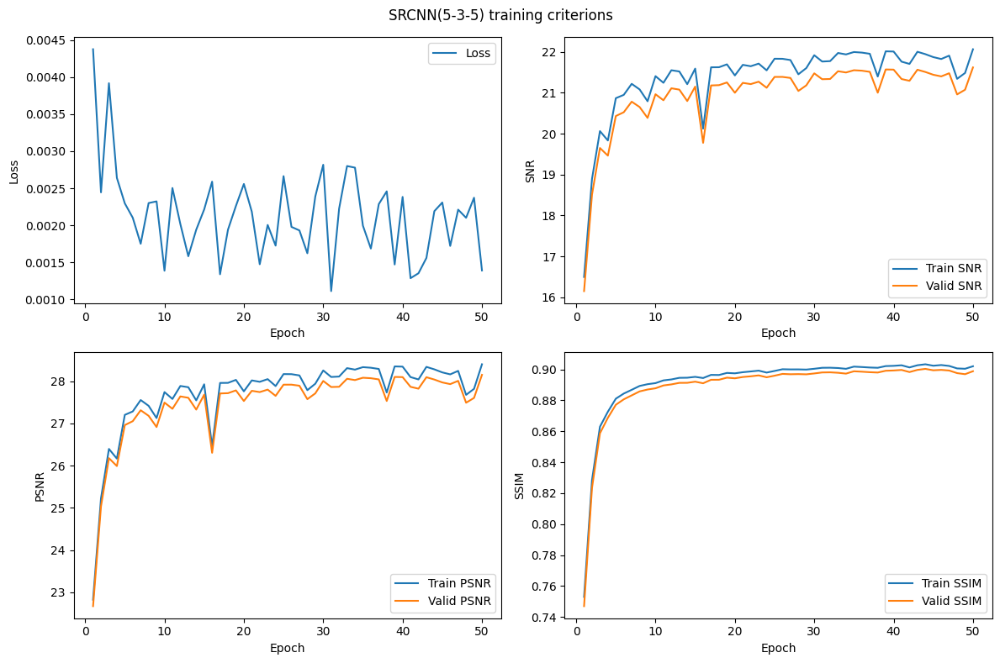

In [11]:
logger.save_to_csv("training_data_535.csv")
plot(logger)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


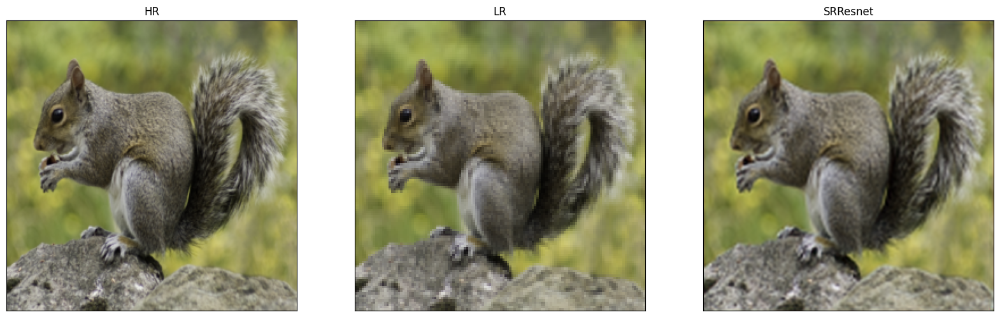

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


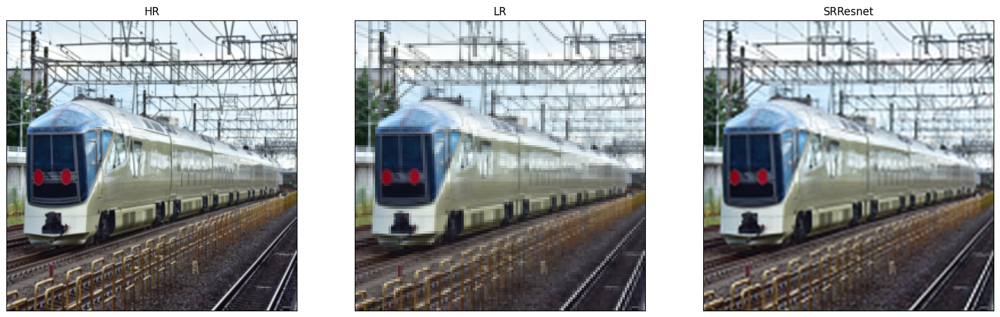

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


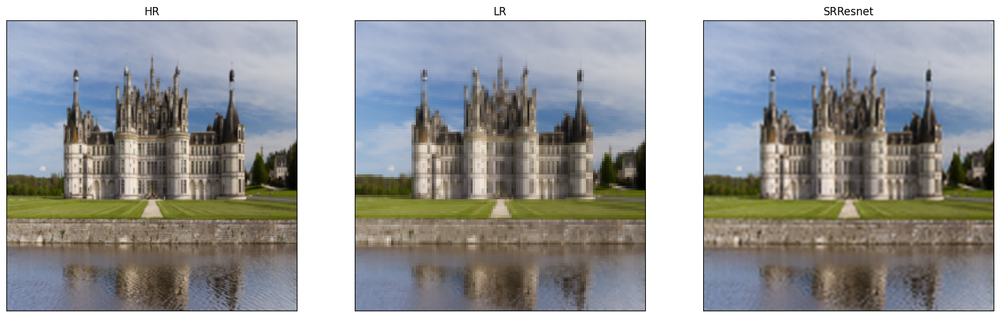

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


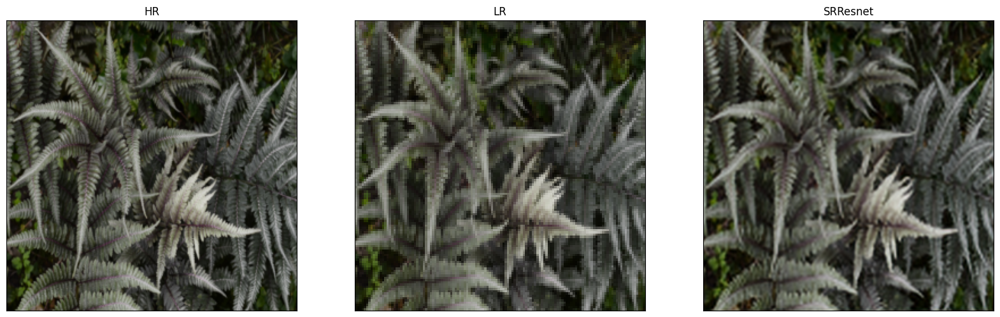

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


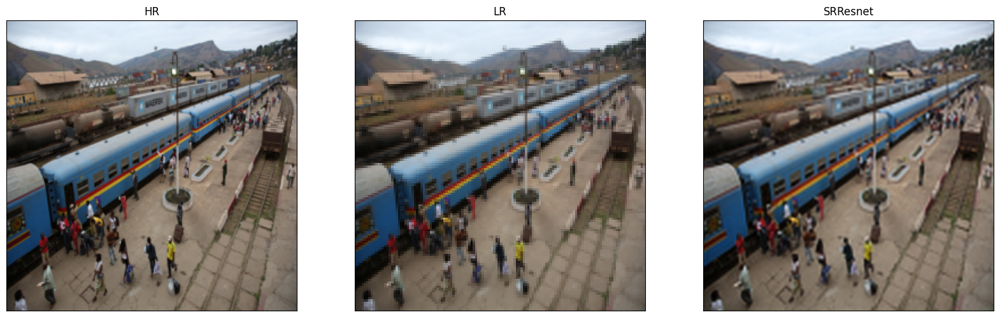

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


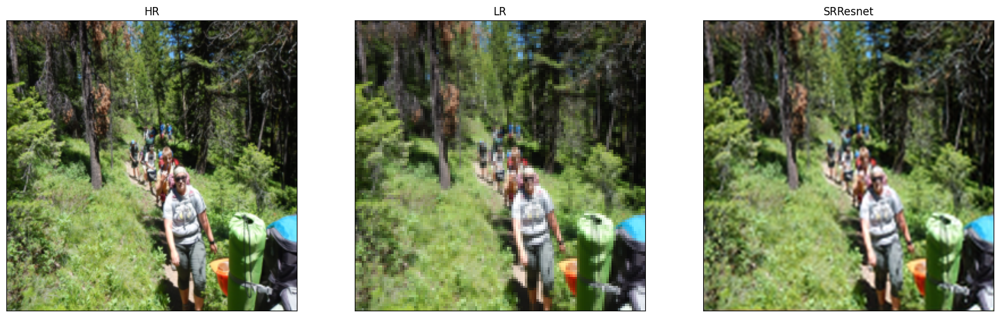

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


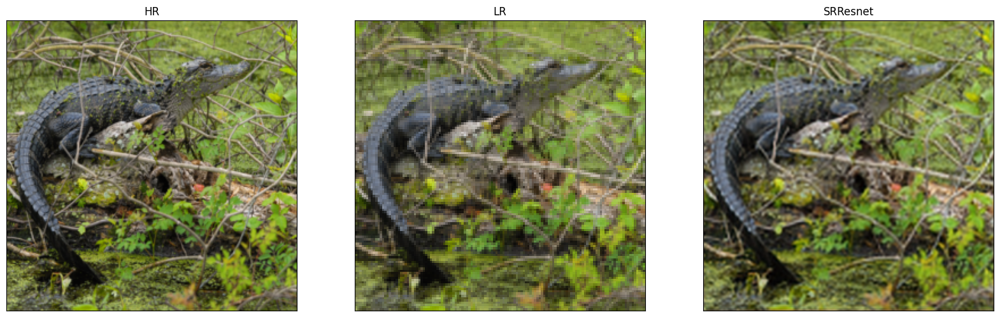

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


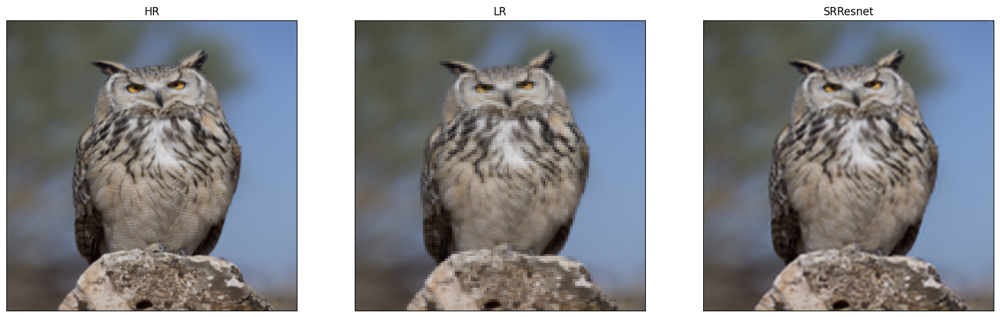

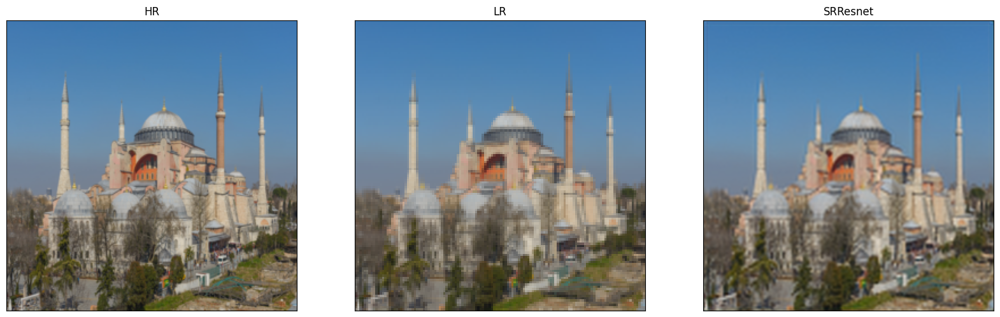

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


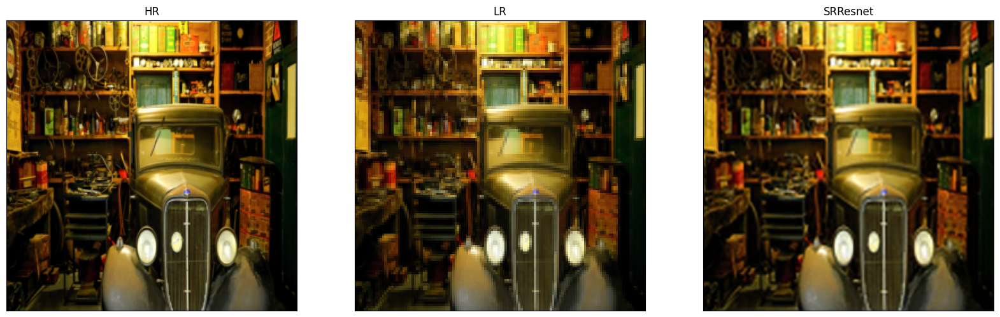

Test:
 SNR: 21.3350, PSNR: 28.1032, SSIM: 0.8983


In [12]:
# from image_show import image_show
model_test = SRCNN2().to(device)
model_test.load_state_dict(torch.load("./saved_model/best_model_535.pth"))

snr_avg, psnr_avg, ssim_avg = evaluate(model_test, test_loader, device, test_mode = True)
print(f"Test:\n SNR: {snr_avg:.4f}, PSNR: {psnr_avg:.4f}, SSIM: {ssim_avg:.4f}")

In [24]:
import cv2
from torchvision.transforms.functional import resize
from PIL import Image

root_dir = './data'

model_confirm = SRCNN2().to(device)
model_confirm.load_state_dict(torch.load("./saved_model/best_model_535.pth"))
model_confirm.eval()

transform = transforms.Compose([transforms.ToTensor()])

for phase in ['train', 'val', 'test']:
    lr_folder = os.path.join(root_dir, phase, 'LR')
    output_folder = os.path.join(root_dir, phase, 'SRCNN')

    os.makedirs(output_folder, exist_ok=True)

    lr_images = os.listdir(lr_folder)
    lr_images.sort()

    for lr_image_name in lr_images:
        lr_image_path = os.path.join(lr_folder, lr_image_name)

        lr_image = Image.open(lr_image_path).convert('RGB')
        lr_image = resize(lr_image, (128, 128))
        lr_tensor = transform(lr_image).unsqueeze(0)

        with torch.no_grad():
            lr_tensor = lr_tensor.to(device)
            sr_tensor = model_confirm(lr_tensor)

        sr_image_np = sr_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
        sr_image_np = (sr_image_np * 255).clip(0, 255).astype(np.uint8)

        sr_image_bgr = cv2.cvtColor(sr_image_np, cv2.COLOR_RGB2BGR)

        cv2.imwrite(os.path.join(output_folder, lr_image_name), sr_image_bgr)

print("SRCNN process completed.")

SRCNN process completed.
